In [79]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

In [127]:
#convert video types from mov to mp4
input_file = r"C:\Users\orand\OneDrive\Data Science Learning\CV Projects\Sample Videos\00091078-f32de4d2.mov"
subprocess.run(['ffmpeg', '-i', input_file, '-qscale', '0', r'00091078-f32de4d2.mp4', '-loglevel', 'quiet'])


CompletedProcess(args=['ffmpeg', '-i', 'C:\\Users\\orand\\OneDrive\\Data Science Learning\\CV Projects\\Sample Videos\\00091078-f32de4d2.mov', '-qscale', '0', '00091078-f32de4d2.mp4', '-loglevel', 'quiet'], returncode=0)

In [128]:
#display video in notebook
ipd.Video('00091078-f32de4d2.mp4', width = 700)

In [129]:
#Open the video and read metadata
#Load in video Capture
cap = cv2.VideoCapture('00091078-f32de4d2.mp4')

In [130]:
#Get the total number of frames in the video
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print('Height: {}, Width: {}'.format(height, width))

Height: 720.0, Width: 1280.0


In [131]:
print("Frame Count: ", cap.get(cv2.CAP_PROP_FRAME_COUNT))
print("FPS: ", cap.get(cv2.CAP_PROP_FPS))


Frame Count:  2400.0
FPS:  59.94005994005994


In [132]:
cap.release()

In [133]:
cap = cv2.VideoCapture('00091078-f32de4d2.mp4')

ret,img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


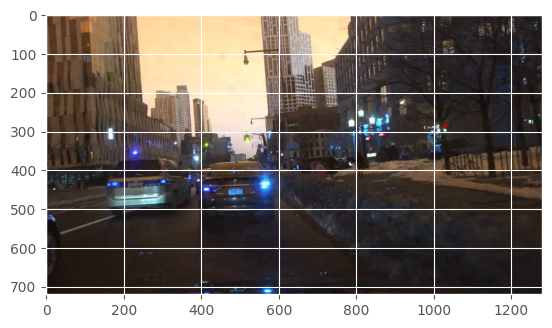

In [134]:
plt.imshow(img)

In [136]:
cap.release()

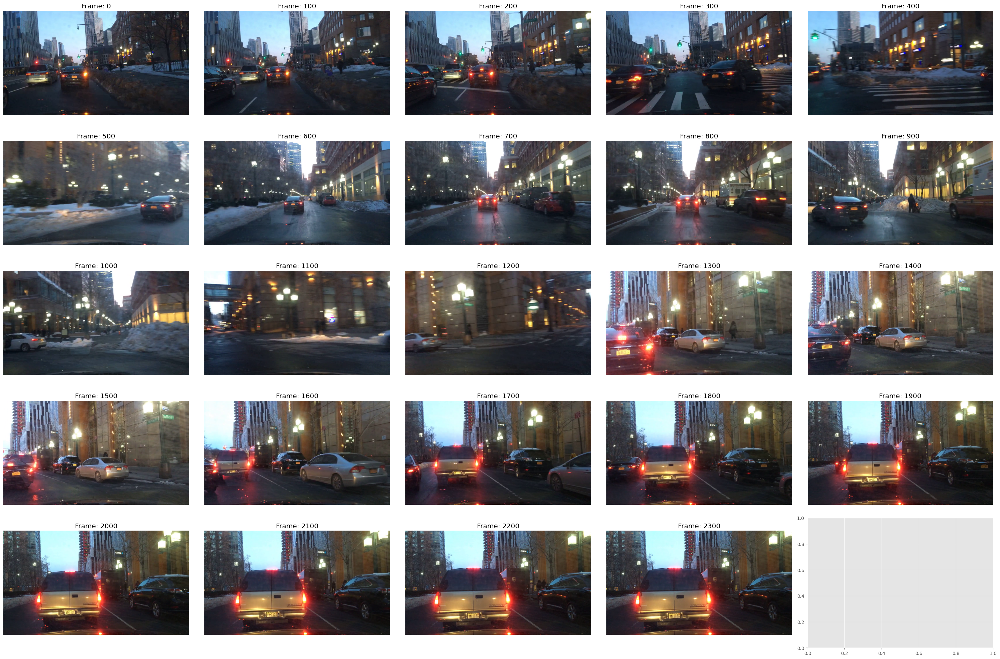

<function VideoCapture.release>

In [137]:
#Display Multiple Frame From the Video

fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()


cap = cv2.VideoCapture('00091078-f32de4d2.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release

In [138]:
#Add Annotations to Video
labels = pd.read_csv(r"C:\Users\orand\OneDrive\Data Science Learning\CV Projects\mot_labels.csv", low_memory = False)
video_labels = labels.query('videoName == "00091078-f32de4d2"').reset_index(drop=True).copy()
video_labels['video_frame'] = (video_labels['frameIndex'] * 11.9).round().astype("int")

In [139]:
video_labels.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,video_frame
0,00091078-f32de4d2-0000001.jpg,00091078-f32de4d2,0,97423.0,car,False,False,False,406.357247,591.619582,376.827706,546.488885,True,0
1,00091078-f32de4d2-0000001.jpg,00091078-f32de4d2,0,97424.0,car,False,False,False,181.864208,392.199978,368.711107,512.711107,True,0
2,00091078-f32de4d2-0000001.jpg,00091078-f32de4d2,0,97425.0,car,False,False,True,1.533424,128.348573,444.382125,654.149690,True,0
3,00091078-f32de4d2-0000001.jpg,00091078-f32de4d2,0,97426.0,car,False,True,False,727.315577,886.318825,356.118173,416.063636,True,0
4,00091078-f32de4d2-0000001.jpg,00091078-f32de4d2,0,97427.0,pedestrian,False,False,False,746.611728,781.567624,357.591954,429.410433,True,0


In [140]:
video_labels['category'].value_counts()

category
car             853
pedestrian      261
truck            89
motorcycle       29
bus              21
other person     15
bicycle           5
Name: count, dtype: int64

In [141]:
#Pull Frame 1035

cap = cv2.VideoCapture("00091078-f32de4d2.mp4")

n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()


In [142]:
# Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

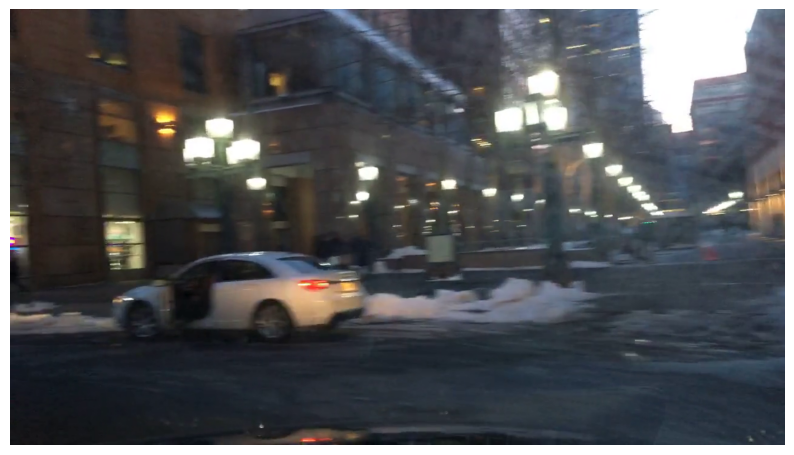

In [143]:
display_cv2_img(img)

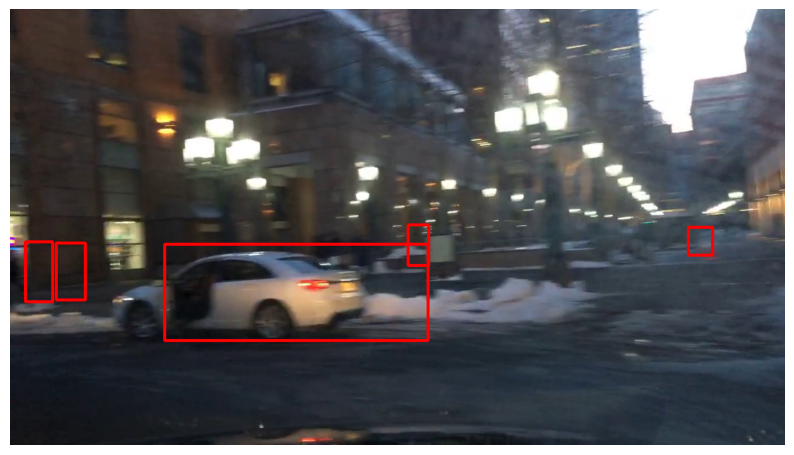

In [144]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0,0, 255), 3)

display_cv2_img(img_example)

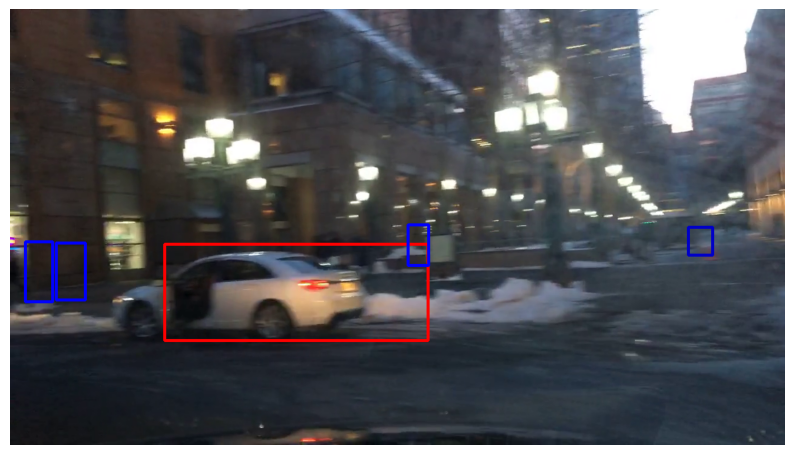

In [146]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels. query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)
    

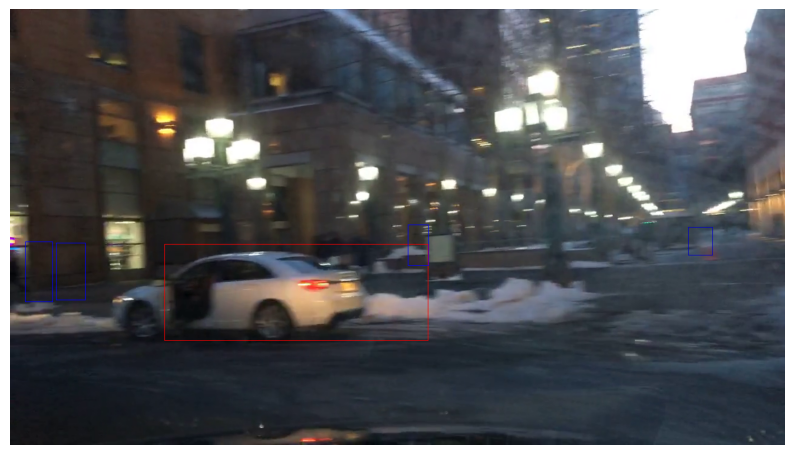

In [147]:
#Adding Text
frame_labels = video_labels.query("video_frame == @frame")
font = cv2. FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    img_example = cv2.rectangle(img_example, pt1, pt2, color)

display_cv2_img(img_example)


In [148]:
cap.release()

In [149]:
#Label and output Annotated Video
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
        pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
        color = color_map[d['category']]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img


In [152]:
VIDEO_CODEC = "MP4V"
fps = 59.94005994005994
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4", cv2.VideoWriter_fourcc(*VIDEO_CODEC), fps, (width, height))

cap = cv2. VideoCapture("00091078-f32de4d2.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total = n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

100%|█████████████████████████████████████████████████████████████████████████████| 2400/2400 [00:15<00:00, 158.57it/s]


In [154]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [156]:
ipd.Video('out_test_compressed.mp4', width = 600)